In [1]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest
from vst_function import *

In [2]:
pip install stattools

^C
Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/opt/anaconda3/lib/python3.11/site-packages/pip/__main__.py", line 24, in <module>
    sys.exit(_main())
             ^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pip/_internal/cli/main.py", line 79, in main
    return command.main(cmd_args)
           ^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pip/_internal/cli/base_command.py", line 101, in main
    return self._main(args)
           ^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pip/_internal/cli/base_command.py", line 236, in _main
    self.handle_pip_version_check(options)
  File "/opt/anaconda3/lib/python3.11/site-packages/pip/_internal/cli/req_command.py", line 188, in handle_pip_version_check
    pip_self_version_check(session, options)
  File "/opt/anaconda3/lib/python3.11/site-packages/pip/_internal/self_outda

In [4]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../data/cnvnator_cnvs.csv")


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Lenght'] < 200000]
data.describe()

data['RD'] = data['RD'] * 2 

data

,Sample_ID,Chromosome,Start,End,CNV_value,Type,RD,Lenght,T-TEST-EVAL,GAUSSIAN-EVAL
0,LP6005441-DNA_A01,1,231001,237900,3.0,duplication,4.178460,6900.0,0.000000e+00,5.215800e-35
1,LP6005441-DNA_A01,1,471201,551200,1.0,deletion,0.375516,80000.0,1.992160e-12,2.215930e+09
2,LP6005441-DNA_A01,1,723801,728100,3.0,duplication,3.189000,4300.0,1.120070e-02,1.742820e+09
3,LP6005441-DNA_A01,1,1010901,1014200,1.0,deletion,0.996498,3300.0,5.434590e-04,2.196950e+09
4,LP6005441-DNA_A01,1,4124201,4127700,1.0,deletion,1.011142,3500.0,4.553500e-11,2.217790e-35
...,...,...,...,...,...,...,...,...,...,...
229336,SS6004480,X,153459601,153466400,3.0,duplication,3.764160,6800.0,3.234320e-09,7.076210e+01
229337,SS6004480,X,153474401,153496200,3.0,duplication,3.468000,21800.0,0.000000e+00,2.123580e+09
229338,SS6004480,X,153498901,153518500,3.0,duplication,3.772040,19600.0,0.000000e+00,2.117350e+07
229339,SS6004480,X,154798801,154804000,1.0,deletion,0.630346,5200.0,3.064860e-11,2.713240e+05


In [5]:
## input for CNVRanger 
cnvranger = data[['Sample_ID','Chromosome', 'Start', 'End','RD']]
cnvranger.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']
cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)
cnvranger.to_csv('../data/cnvnator_cnvranger_input.csv',  index=False)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_48256/2628830680.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)


In [6]:
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')
data.columns = ['Chromosome', 'Start', 'End','CNVR','Sample_ID','CNV_Start', 'CNV_End', 'RD', 'Lenght']
data

,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,4,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,3,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,1,3500.0
...,...,...,...,...,...,...,...,...,...
229336,X,NaN,NaN,NaN,SS6004480,153459601,153466400,3,6800.0
229337,X,NaN,NaN,NaN,SS6004480,153474401,153496200,3,21800.0
229338,X,NaN,NaN,NaN,SS6004480,153498901,153518500,3,19600.0
229339,X,NaN,NaN,NaN,SS6004480,154798801,154804000,0,5200.0


In [7]:
## Filter by chromosomes
data_x = distribution[distribution.Chromosome == 'X']
data_no_sex_chr = distribution[distribution.Chromosome != 'Y']
data = data_no_sex_chr[data_no_sex_chr.Chromosome != 'X']

data = data[data['GAUSSIAN-EVAL'] < 0.05]
data

,Sample_ID,Chromosome,Start,End,CNV_value,Type,RD,Lenght,T-TEST-EVAL,GAUSSIAN-EVAL
0,LP6005441-DNA_A01,1,231001,237900,3.0,duplication,2.089230,6900.0,0.000000e+00,5.215800e-35
4,LP6005441-DNA_A01,1,4124201,4127700,1.0,deletion,0.505571,3500.0,4.553500e-11,2.217790e-35
6,LP6005441-DNA_A01,1,13698701,13773800,1.0,deletion,0.498061,75100.0,2.122140e-12,1.148110e-26
7,LP6005441-DNA_A01,1,13777401,13781300,1.0,deletion,0.508675,3900.0,4.086470e-11,5.781320e-35
9,LP6005441-DNA_A01,1,35101401,35111900,1.0,deletion,0.476836,10500.0,1.517830e-11,5.531960e-128
...,...,...,...,...,...,...,...,...,...,...
229286,SS6004480,9,106568301,106569700,1.0,deletion,0.466723,1400.0,1.565730e-05,1.842890e-10
229287,SS6004480,9,131412001,131414100,1.0,deletion,0.451900,2100.0,1.556540e-07,2.014000e-09
229290,SS6004480,9,138214101,138217600,1.0,deletion,0.525251,3500.0,4.553500e-11,1.258500e-18
229291,SS6004480,9,138479101,138480200,1.0,deletion,0.000000,1100.0,1.448840e-10,4.148920e-61


In [8]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv#.loc[cnv['Chr'] == '8']




Sample_ID,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,1,176101,230900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,176201,230100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,176901,230500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,177001,230500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,177201,229300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50925,9,140411501,140413200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.24938,NaN,NaN,NaN,NaN,NaN,NaN
50926,9,140411501,140413400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.30033,NaN,NaN
50927,9,140411501,140413500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50928,9,140411501,140413700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.06984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,50920,50921,50922,50923,50924,50925,50926,50927,50928,50929
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.00000,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.00000,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.00000,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.00000,2.0,2.0,2.0
LP6005441-DNA_A08,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.00000,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.25713,2.0,2.00000,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.00000,2.0,2.0,2.0
SS6004478,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.00000,2.0,2.30033,2.0,2.0,2.0


In [10]:
features = anotation.loc[:,["10-Region"]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,10-Region,0,1,2,3,4,5,6,7,8,...,50920,50921,50922,50923,50924,50925,50926,50927,50928,50929
LP6005443-DNA_B06,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005442-DNA_D08,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005441-DNA_D07,SouthAsia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005441-DNA_C07,SouthAsia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005442-DNA_G11,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.49261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005519-DNA_A06,EastAsia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005519-DNA_B06,EastAsia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000
LP6005441-DNA_B08,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.00000


In [20]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [21]:
#### Names to pair-population
regions = dt['10-Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

for j in dt_groupped:
    del j['10-Region']

In [22]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


,0,1,2,3,4,5,6,7,8,9,...,50920,50921,50922,50923,50924,50925,50926,50927,50928,50929
Africa-America,NaN,0.004813,NaN,NaN,0.004813,NaN,NaN,NaN,0.004813,NaN,...,NaN,0.004813,NaN,NaN,NaN,0.009566,NaN,NaN,NaN,NaN
Africa-CentralAsiaSiberia,NaN,0.005196,NaN,NaN,0.005196,NaN,NaN,NaN,0.005196,0.014303,...,NaN,0.005196,NaN,0.014303,NaN,0.010323,NaN,NaN,NaN,0.014303
Africa-EastAsia,NaN,0.003736,NaN,NaN,0.003736,NaN,NaN,NaN,0.003736,NaN,...,NaN,0.003736,NaN,NaN,NaN,0.007433,NaN,NaN,NaN,NaN
Africa-Oceania,NaN,0.003425,NaN,NaN,0.003425,NaN,NaN,0.031684,0.003425,NaN,...,NaN,0.003425,NaN,NaN,NaN,0.006816,0.031684,NaN,0.031684,NaN
Africa-SouthAsia,NaN,0.003206,0.035300,NaN,0.003206,0.035300,NaN,NaN,0.003206,NaN,...,NaN,0.003206,0.035300,NaN,0.035300,0.006382,NaN,NaN,NaN,NaN
Africa-WestEurasia,0.013449,0.005340,NaN,0.013449,0.005340,NaN,0.013449,NaN,0.005340,NaN,...,0.013449,0.005340,NaN,NaN,NaN,0.010608,NaN,0.013449,NaN,NaN
America-CentralAsiaSiberia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.010809,...,NaN,NaN,NaN,0.010809,NaN,NaN,NaN,NaN,NaN,0.010809
America-EastAsia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
America-Oceania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.026210,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.026210,NaN,0.026210,NaN
America-SouthAsia,NaN,NaN,0.029545,NaN,NaN,0.029545,NaN,NaN,NaN,NaN,...,NaN,NaN,0.029545,NaN,0.029545,NaN,NaN,NaN,NaN,NaN


In [23]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,327,580,681,953,985,1055,1155,1184,1273,1343,...,44600,44688,50006,50642,50671,50763,50807,50840,50859,50916
Africa-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-CentralAsiaSiberia,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
Africa-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-Oceania,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-SouthAsia,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,True,True,False,False,False
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
America-CentralAsiaSiberia,False,False,False,False,False,False,False,False,True,False,...,False,True,True,True,False,False,False,True,True,True
America-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
America-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
America-SouthAsia,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,True,True,False,True,False


In [24]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', cnv['Chromosome'])
vst_dt.insert (1, 'start', cnv['Start'])
vst_dt.insert (2, 'end', cnv['End'])
#vst_dt.insert (3, 'type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,1,176101,230900,0.00000,0.00000,0.00000,0.00000,0.00000,0.01345,0.00000,...,0.00000,0.00000,0.00000,0.01075,0.0000,0.00000,0.00815,0.00000,0.00756,0.00714
1,1,176201,230100,0.00481,0.00520,0.00374,0.00342,0.00321,0.00534,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000,0.00000
2,1,176901,230500,0.00000,0.00000,0.00000,0.00000,0.03530,0.00000,0.00000,...,0.00000,0.00000,0.03077,0.00000,0.0000,0.02557,0.00000,0.02424,0.00000,0.03121
3,1,177001,230500,0.00000,0.00000,0.00000,0.00000,0.00000,0.01345,0.00000,...,0.00000,0.00000,0.00000,0.01075,0.0000,0.00000,0.00815,0.00000,0.00756,0.00714
4,1,177201,229300,0.00481,0.00520,0.00374,0.00342,0.00321,0.00534,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50925,9,140411501,140413200,0.00957,0.01032,0.00743,0.00682,0.00638,0.01061,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000,0.00000
50926,9,140411501,140413400,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.0225,0.00000,0.00000,0.02037,0.02778,0.00000
50927,9,140411501,140413500,0.00000,0.00000,0.00000,0.00000,0.00000,0.01345,0.00000,...,0.00000,0.00000,0.00000,0.01075,0.0000,0.00000,0.00815,0.00000,0.00756,0.00714
50928,9,140411501,140413700,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.0225,0.00000,0.00000,0.02037,0.02778,0.00000


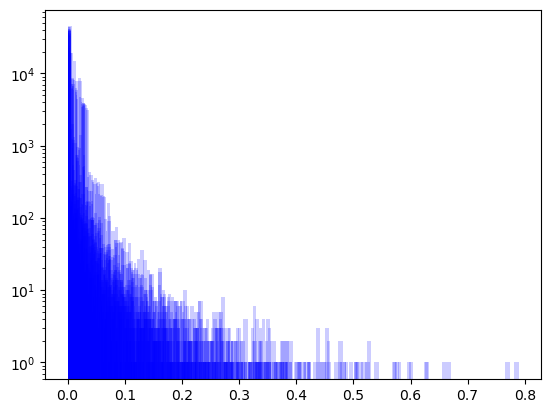

In [25]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,3:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")

In [26]:
chr8 = vst_dt[vst_dt['chr'] == '8']
chr8[chr8['start'] > 22700000].sort_values(by='start', ascending=True).head(50)

,chr,start,end,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
43155,8,22991201,22996700,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000
43156,8,22991401,22996700,0.00000,0.01430,0.00000,0.03168,0.00000,0.00000,0.01081,...,0.00877,0.00719,0.00769,0.01175,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000
43157,8,22991401,23004500,0.00000,0.01430,0.00000,0.00000,0.00000,0.00000,0.01081,...,0.00877,0.00814,0.00769,0.01175,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
43158,8,22991901,22996700,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000
43159,8,22992201,22996700,0.00000,0.00000,0.00000,0.06397,0.00000,0.00000,0.00000,...,0.00000,0.05550,0.00000,0.00000,0.04587,0.00000,0.00000,0.04162,0.05631,0.00000
43160,8,22992301,22996600,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000
43161,8,22992401,23004200,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000
43162,8,22993001,22996700,0.00000,0.01430,0.00000,0.06377,0.00000,0.00000,0.01081,...,0.00877,0.01700,0.00769,0.01175,0.04572,0.00000,0.00000,0.04149,0.05613,0.00000
43163,8,22993201,22996700,0.00000,0.00000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.00000,0.00000,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000
43164,8,22997801,23000500,0.00000,0.00000,0.00000,0.06290,0.00000,0.00000,0.00000,...,0.00000,0.05456,0.00000,0.00000,0.04509,0.00000,0.00000,0.04091,0.05536,0.00000


In [27]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

KeyError: 'WestEurasia-Oceania'

In [28]:
#### SAVING VST FILE
#vst_dt.to_csv('../data/vst_results_cnvnator.csv')
vst_dt['chr'] = vst_dt['chr'].astype(int)
vst_dt = vst_dt.sort_values(by='chr')
vst_dt

,chr,start,end,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,1,176101,230900,0.00000,0.0000,0.00000,0.00000,0.00000,0.01345,0.00000,...,0.00000,0.00000,0.0,0.01075,0.00000,0.00000,0.00815,0.00000,0.00756,0.00714
4051,1,149239901,149260000,0.00000,0.0000,0.00000,0.00000,0.00000,0.01345,0.00000,...,0.00000,0.00000,0.0,0.01075,0.00000,0.00000,0.00815,0.00000,0.00756,0.00714
4050,1,149239901,149259900,0.00481,0.0052,0.00538,0.00342,0.00321,0.00534,0.00000,...,0.02328,0.00000,0.0,0.00000,0.01778,0.01698,0.02366,0.00000,0.00000,0.00000
4049,1,149239901,149249700,0.00481,0.0052,0.00374,0.00342,0.00321,0.00534,0.00000,...,0.00000,0.00000,0.0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4048,1,149236901,149239800,0.00481,0.0052,0.00374,0.00342,0.00321,0.00534,0.00000,...,0.00000,0.00000,0.0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28648,22,20504001,20631300,0.00000,0.0000,0.00000,0.00000,0.00000,0.01345,0.00000,...,0.00000,0.00000,0.0,0.01075,0.00000,0.00000,0.00815,0.00000,0.00756,0.00714
28649,22,20507501,20625300,0.00000,0.0000,0.02731,0.00000,0.00000,0.00000,0.00000,...,0.02328,0.00000,0.0,0.00000,0.01778,0.01698,0.02366,0.00000,0.00000,0.00000
28650,22,20507501,20631300,0.01686,0.0000,0.00000,0.00000,0.00000,0.00000,0.01376,...,0.00000,0.00000,0.0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
28752,22,20637001,20643100,0.00000,0.0000,0.00000,0.03168,0.00000,0.00000,0.00000,...,0.00000,0.02736,0.0,0.00000,0.02250,0.00000,0.00000,0.02037,0.02778,0.00000


In [29]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='WestEurasia-Oceania', aspect=3.7, 
                  hue='chr', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('chr')['i'].median()
plot.ax.set_xlabel('chr'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

ValueError: Could not interpret value `WestEurasia-Oceania` for parameter `y`

<h1> Computing permutation for each pair-group whole samples

In [ ]:
from stattools.resampling import PermutationTest
PermutationTest

In [40]:
pt = PermutationTest(dt_group.get_group(str('WestEurasia'))[176], dt_group.get_group(str('America'))[176], stat=vst_function, n_perm=999)

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: RuntimeWarning: invalid value encountered in scalar divide
  vst = (vt-vs)/vt


In [41]:
p_value_ = pt.p_value()
print(f"p-value: {p_value_:.4f}")

p-value: 0.0010


<h1> Deletions PCA

In [30]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,327,580,681,953,985,1055,1155,1184,1273,1343,...,44600,44688,50006,50642,50671,50763,50807,50840,50859,50916
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,0.468723,0.022213,2.000000,0.503000,0.002383,2.000000,2.00000,2.000000,0.001323,...,0.090508,2.000000,2.000000,2.000000,0.442444,2.000000,2.000000,2.0,2.000000,0.526143
LP6005441-DNA_A04,2.0,2.000000,2.000000,0.469635,2.000000,0.001388,2.000000,2.00000,2.000000,0.001674,...,0.078895,0.482626,2.000000,0.505127,2.000000,0.546489,0.005694,2.0,0.000000,2.000000
LP6005441-DNA_A05,2.0,0.471221,2.000000,2.000000,2.000000,0.493222,0.474593,2.00000,2.000000,0.500784,...,2.000000,0.463408,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,2.000000,0.000000
LP6005441-DNA_A06,2.0,2.000000,2.000000,2.000000,2.000000,0.477038,2.000000,2.00000,0.511346,0.486460,...,0.066170,2.000000,0.320954,2.000000,2.000000,2.000000,2.000000,2.0,0.518588,0.553456
LP6005441-DNA_A08,2.0,0.461308,2.000000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,0.486911,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,0.000000,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.0,2.000000,2.000000,2.000000,2.000000,0.001773,2.000000,2.00000,2.000000,2.000000,...,2.000000,2.000000,0.227670,0.506512,2.000000,0.013988,0.009683,2.0,0.000000,0.005321
SS6004477,2.0,2.000000,2.000000,2.000000,0.017509,0.001223,2.000000,1.98171,2.000000,0.001843,...,2.000000,2.000000,2.000000,2.000000,0.510076,2.000000,2.000000,2.0,2.000000,2.000000
SS6004478,2.0,0.441612,2.000000,2.000000,2.000000,0.487295,2.000000,2.04448,2.000000,0.002485,...,2.000000,2.000000,0.194809,0.006271,2.000000,2.000000,2.000000,2.0,2.000000,2.000000


In [31]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,327,580,681,953,985,1055,1155,1184,1273,1343,...,44600,44688,50006,50642,50671,50763,50807,50840,50859,50916
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,0.468723,0.022213,2.000000,0.503000,0.002383,2.000000,2.00000,2.000000,0.001323,...,0.090508,2.000000,2.000000,2.000000,0.442444,2.000000,2.000000,2.0,2.000000,0.526143
LP6005441-DNA_A04,2.0,2.000000,2.000000,0.469635,2.000000,0.001388,2.000000,2.00000,2.000000,0.001674,...,0.078895,0.482626,2.000000,0.505127,2.000000,0.546489,0.005694,2.0,0.000000,2.000000
LP6005441-DNA_A05,2.0,0.471221,2.000000,2.000000,2.000000,0.493222,0.474593,2.00000,2.000000,0.500784,...,2.000000,0.463408,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,2.000000,0.000000
LP6005441-DNA_A06,2.0,2.000000,2.000000,2.000000,2.000000,0.477038,2.000000,2.00000,0.511346,0.486460,...,0.066170,2.000000,0.320954,2.000000,2.000000,2.000000,2.000000,2.0,0.518588,0.553456
LP6005441-DNA_A08,2.0,0.461308,2.000000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,0.486911,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,0.000000,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.0,2.000000,2.000000,2.000000,2.000000,0.001773,2.000000,2.00000,2.000000,2.000000,...,2.000000,2.000000,0.227670,0.506512,2.000000,0.013988,0.009683,2.0,0.000000,0.005321
SS6004477,2.0,2.000000,2.000000,2.000000,0.017509,0.001223,2.000000,1.98171,2.000000,0.001843,...,2.000000,2.000000,2.000000,2.000000,0.510076,2.000000,2.000000,2.0,2.000000,2.000000
SS6004478,2.0,0.441612,2.000000,2.000000,2.000000,0.487295,2.000000,2.04448,2.000000,0.002485,...,2.000000,2.000000,0.194809,0.006271,2.000000,2.000000,2.000000,2.0,2.000000,2.000000


In [32]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [33]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-1.641910,4.314752,0.560567,-0.165634,-0.637697,-2.079082,0.381776,1.118465,1.998183,1.028292
LP6005441-DNA_A04,F,America,Colombia,-4.061501,-3.185445,4.556390,2.336569,0.941784,-1.452371,1.225481,-0.305169,1.652145,0.838430
LP6005441-DNA_A05,M,WestEurasia,France,0.820019,-0.893660,-2.519519,0.506691,0.803031,0.569536,-0.937908,-1.177939,-0.610879,-0.447560
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),-0.399698,-2.220309,-2.451832,0.843117,-0.646629,-1.073345,0.107701,1.110377,-1.687335,0.992369
LP6005441-DNA_A08,M,Africa,Congo,5.304273,0.187550,2.175041,0.598129,0.131862,0.693550,1.510297,-1.387765,0.381281,-0.662602
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-1.727926,-3.103747,3.385057,3.530653,-1.546830,-1.403814,-1.227428,1.031444,0.629195,-2.475196
SS6004477,M,Oceania,Australia,0.520491,6.050753,0.484950,3.620824,-0.311663,1.185900,-0.962030,-1.611469,1.872929,-0.827953
SS6004478,U,Oceania,Australia,0.902361,4.567514,0.121347,1.305225,-0.868692,0.175163,-1.931007,-0.098165,0.000820,0.028158
SS6004479,F,America,Mexico,-2.168869,-2.382197,2.447602,2.934968,-3.569022,-1.550889,-1.715316,-0.217897,0.433067,-0.047480


In [34]:
pca.explained_variance_ratio_

array([0.07095867, 0.03822245, 0.03362572, 0.02642123, 0.01550412,
       0.01524898, 0.0146508 , 0.01418206, 0.01384757, 0.0136183 ])

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -1.641910     4.314752     0.560567   
America            F        Colombia    -4.061501    -3.185445     4.556390   
WestEurasia        M          France     0.820019    -0.893660    -2.519519   
WestEurasia        M  Italy(Bergamo)    -0.399698    -2.220309    -2.451832   
Africa             M           Congo     5.304273     0.187550     2.175041   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -1.727926    -3.103747     3.385057   
Oceania            M       Australia     0.520491     6.050753     0.484950   
Oceania            U       Australia     0.902361     4.567514     0.121347   
America            F          Mexico    -2.168869    -2.382197     2.447602   
Africa             M           Sudan     5.021310   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -1.641910     4.314752     0.560567   
America            F        Colombia    -4.061501    -3.185445     4.556390   
WestEurasia        M          France     0.820019    -0.893660    -2.519519   
WestEurasia        M  Italy(Bergamo)    -0.399698    -2.220309    -2.451832   
Africa             M           Congo     5.304273     0.187550     2.175041   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -1.727926    -3.103747     3.385057   
Oceania            M       Australia     0.520491     6.050753     0.484950   
Oceania            U       Australia     0.902361     4.567514     0.121347   
America            F          Mexico    -2.168869    -2.382197     2.447602   
Africa             M           Sudan     5.021310   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

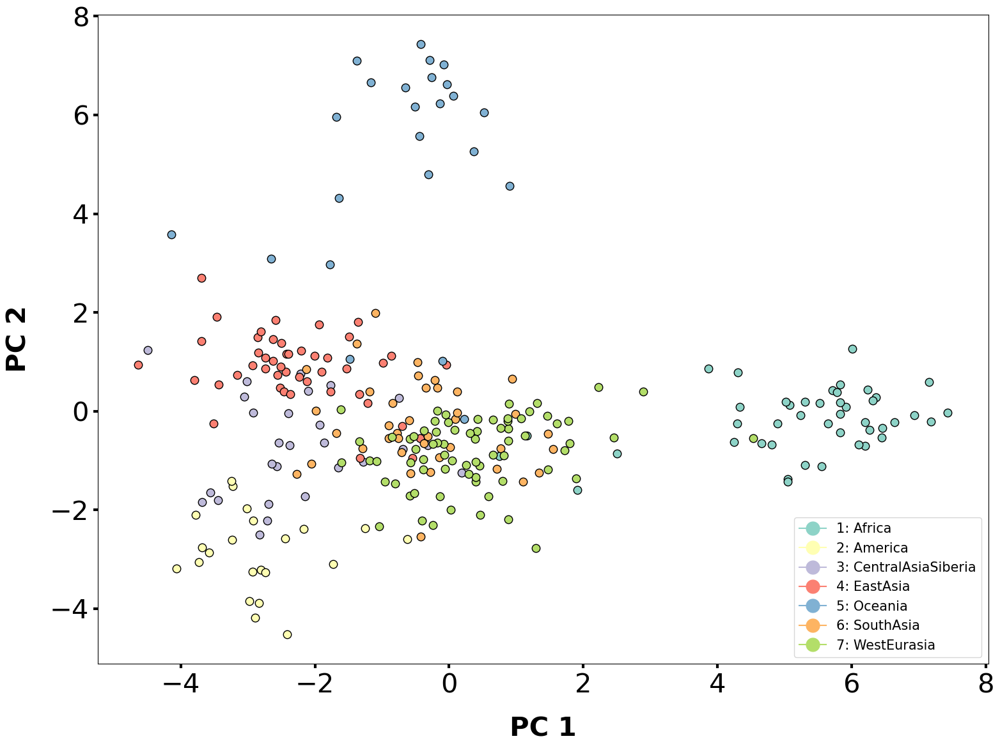

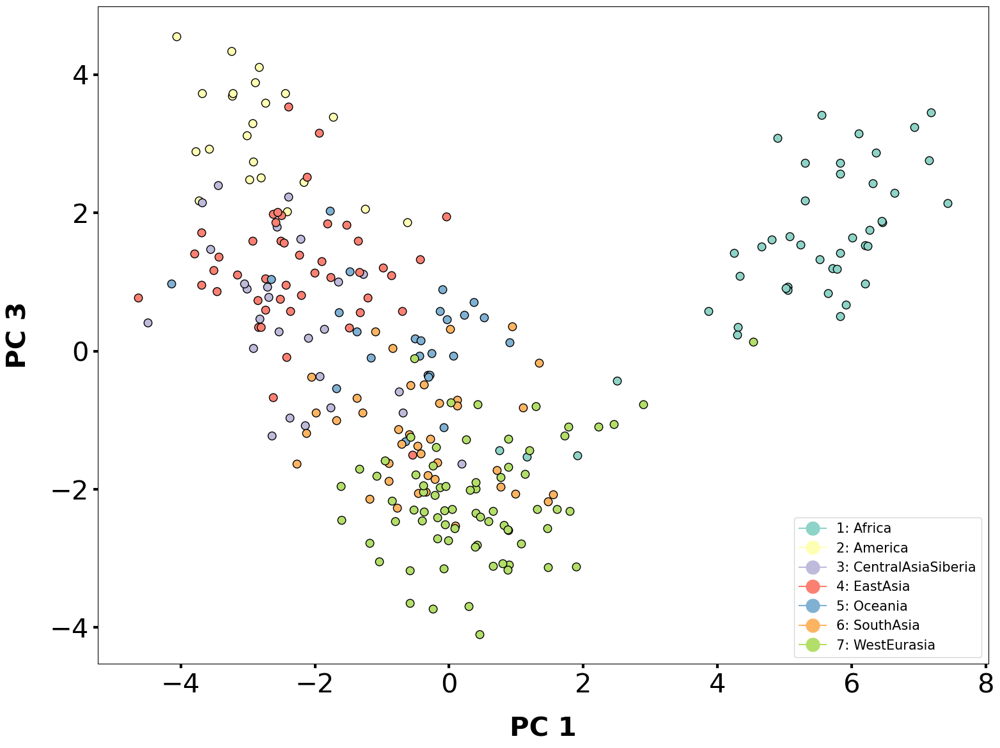

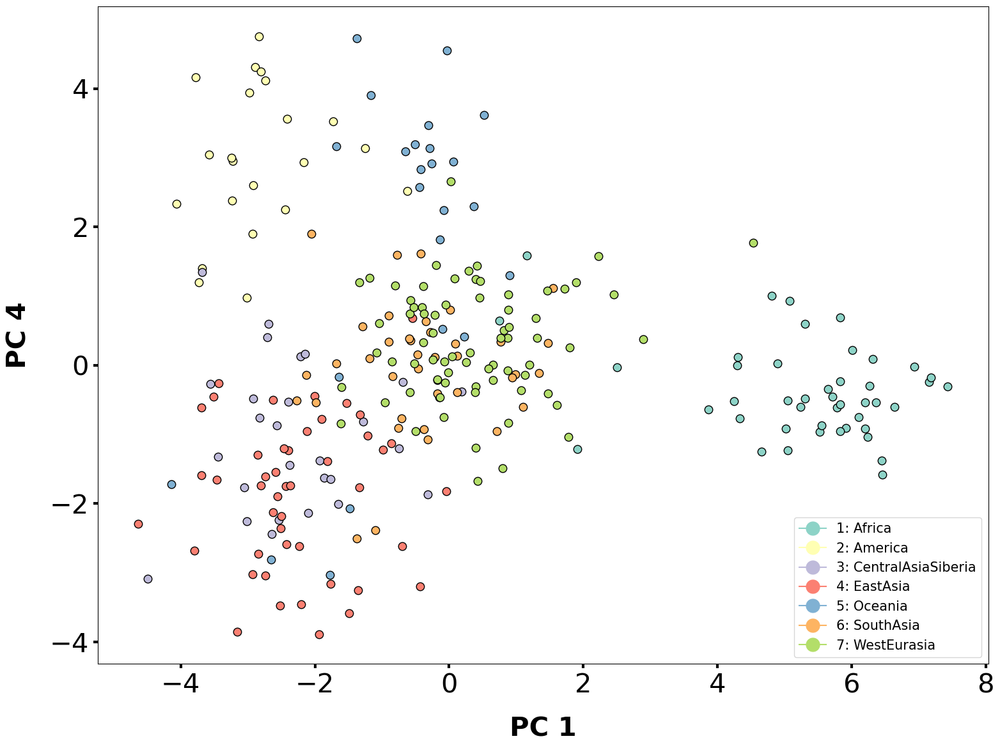

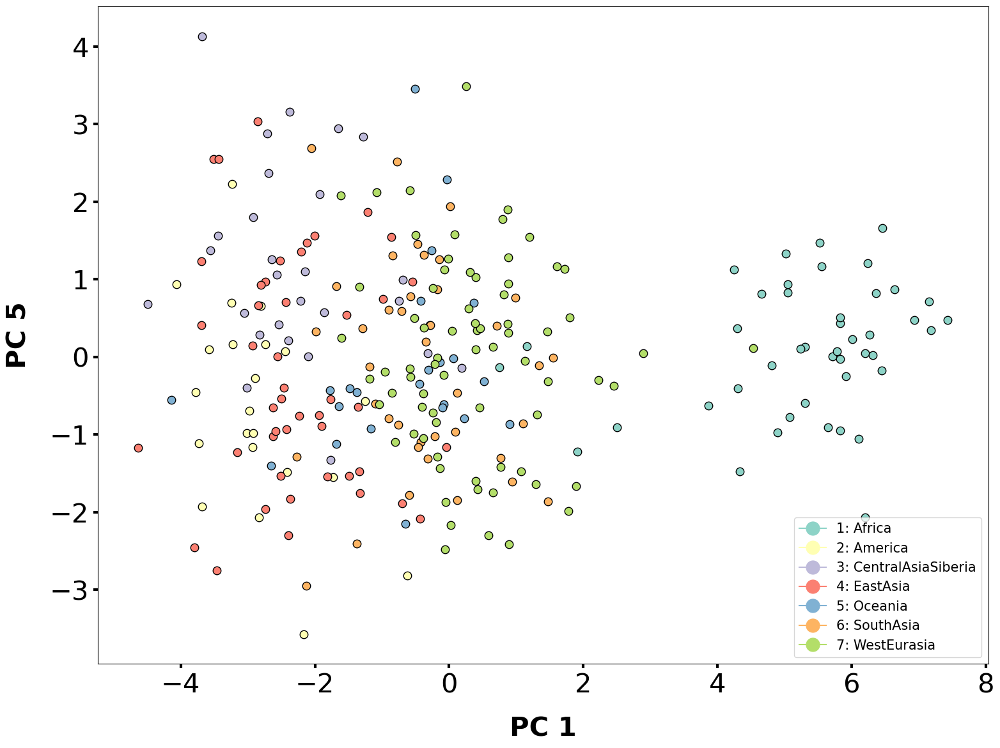

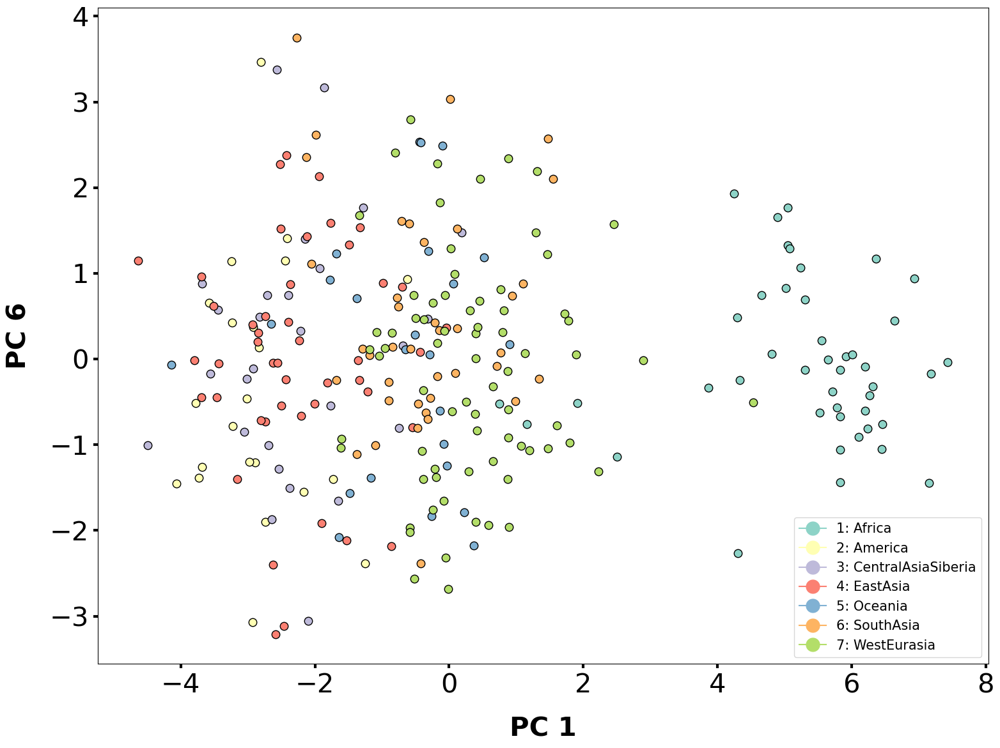

...

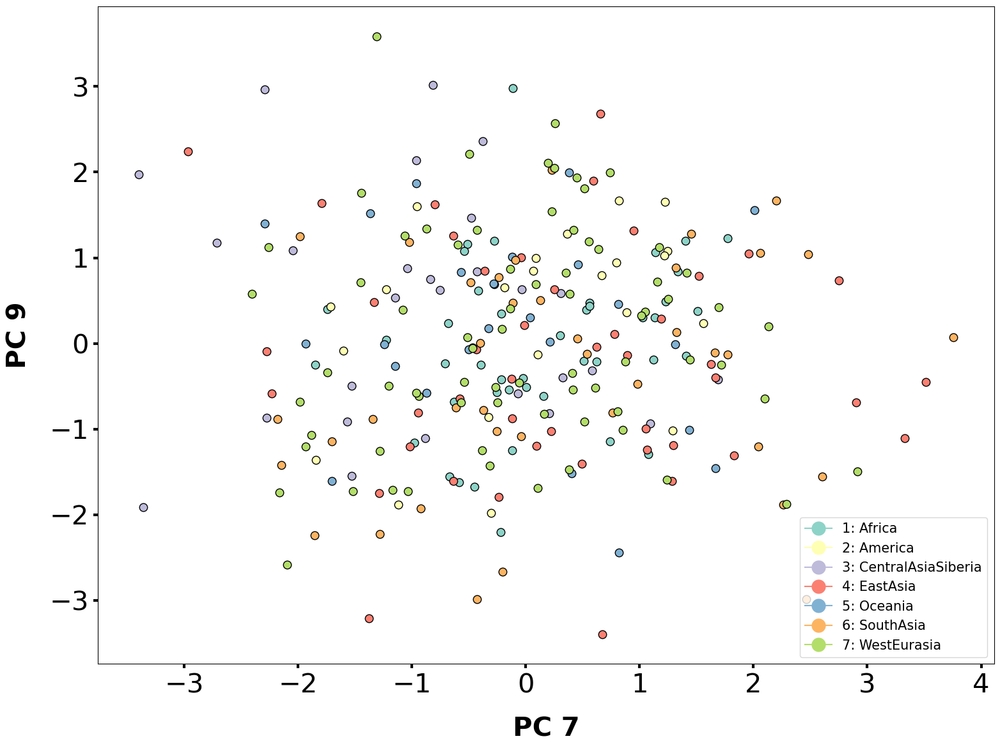

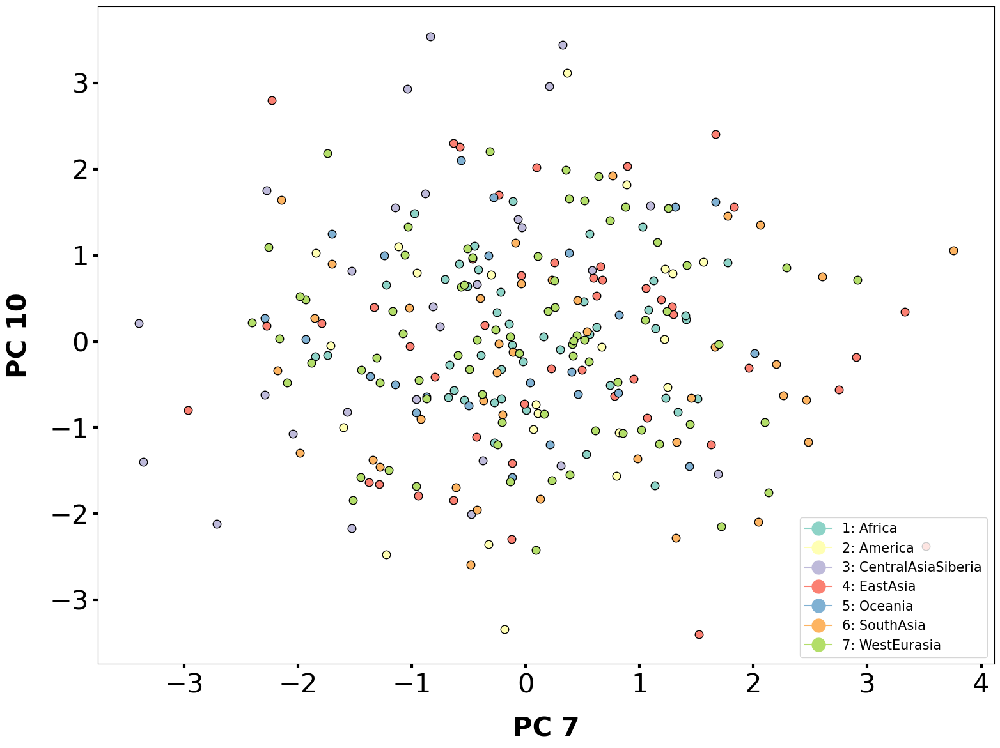

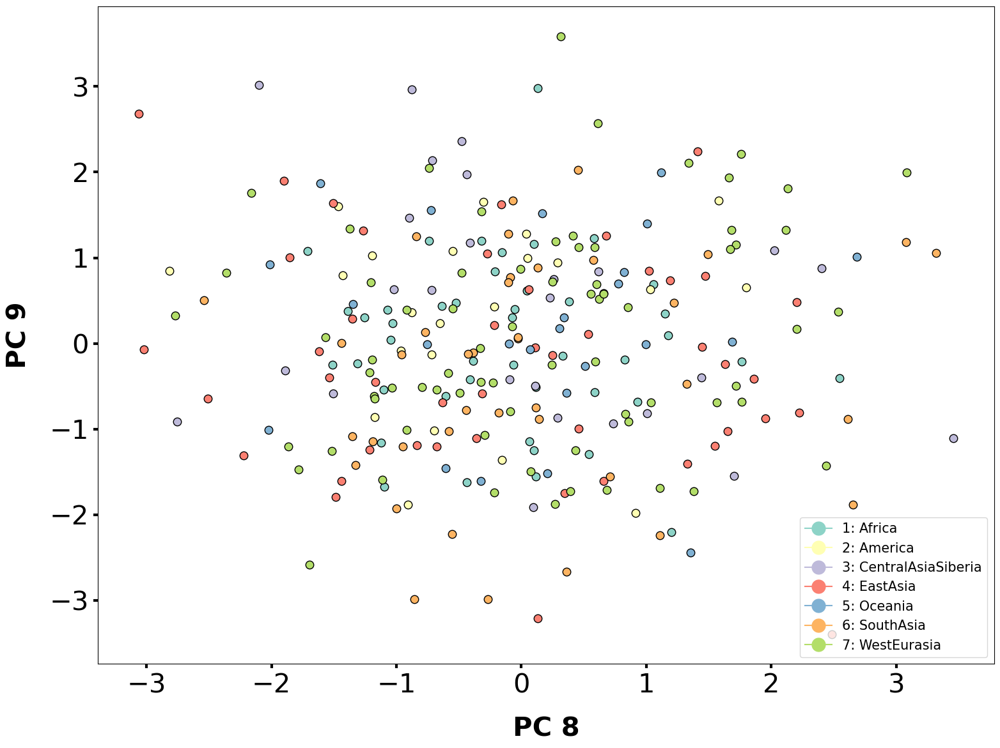

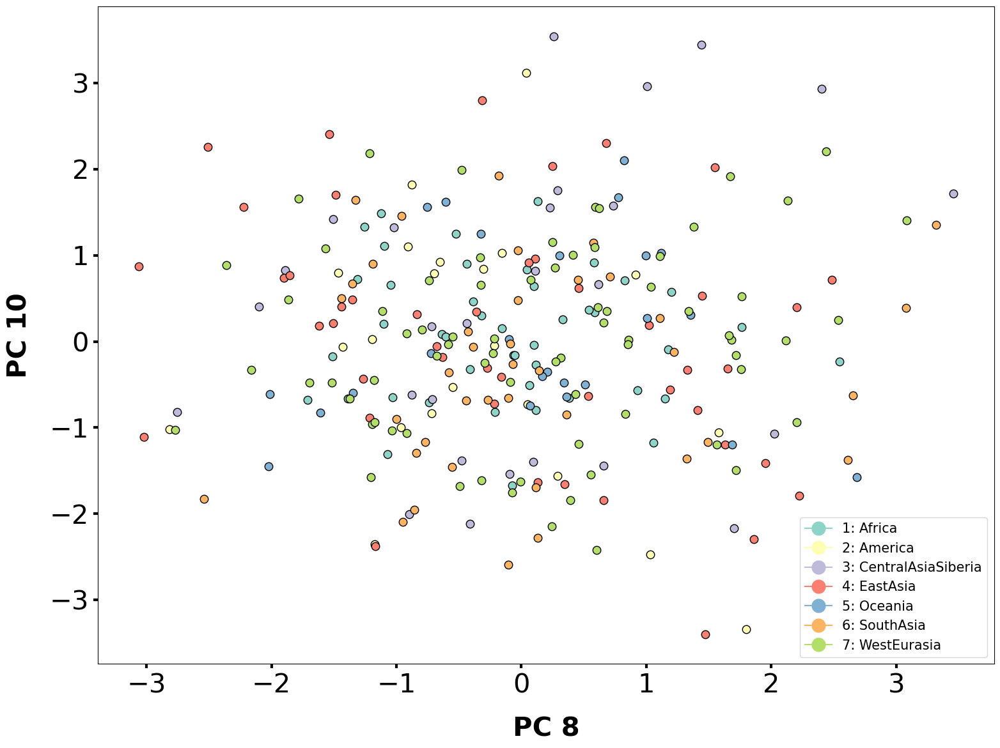

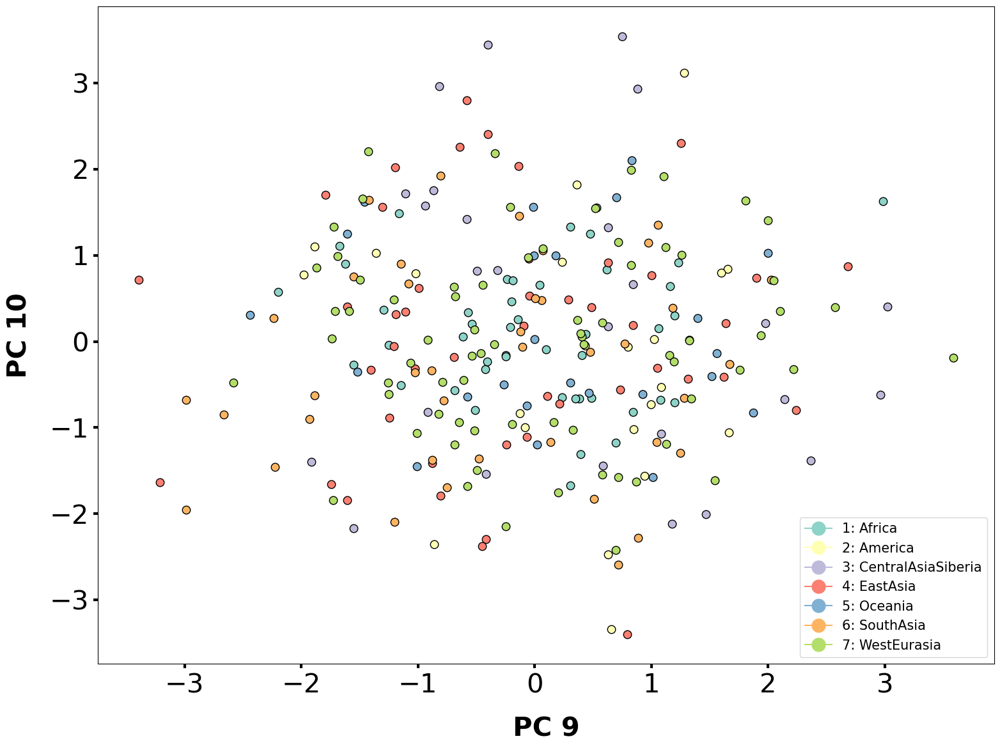

In [36]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -1.641910     4.314752     0.560567   
America            F        Colombia    -4.061501    -3.185445     4.556390   
WestEurasia        M          France     0.820019    -0.893660    -2.519519   
WestEurasia        M  Italy(Bergamo)    -0.399698    -2.220309    -2.451832   
Africa             M           Congo     5.304273     0.187550     2.175041   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -1.727926    -3.103747     3.385057   
Oceania            M       Australia     0.520491     6.050753     0.484950   
Oceania            U       Australia     0.902361     4.567514     0.121347   
America            F          Mexico    -2.168869    -2.382197     2.447602   
Africa             M           Sudan     5.021310   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


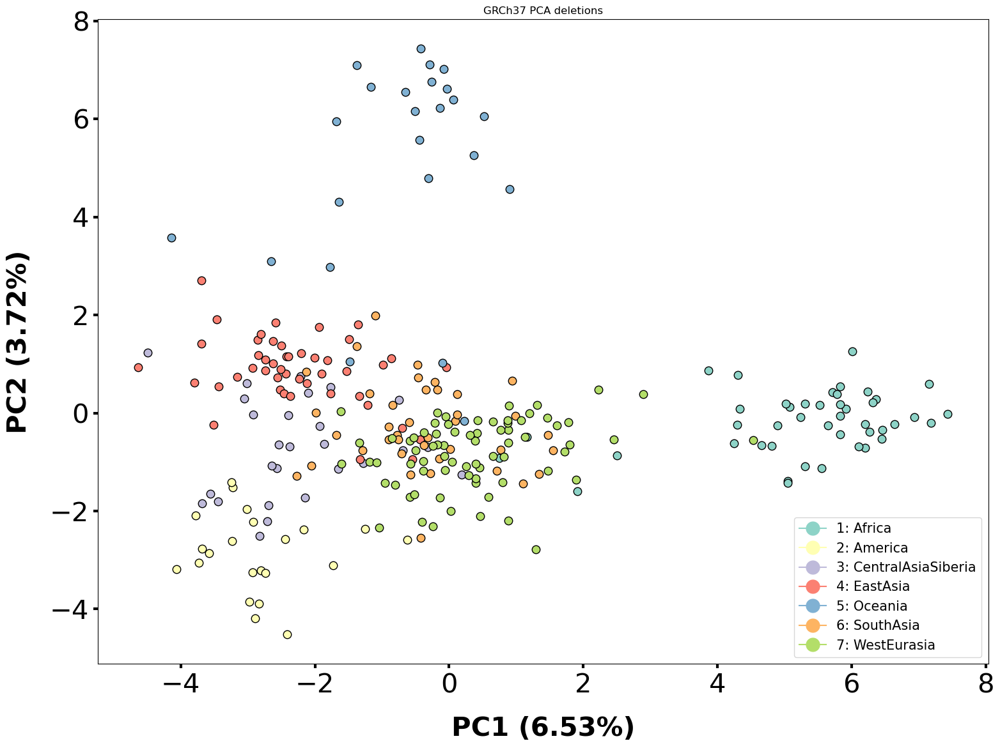

In [37]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.53%)', label_vertical='PC2 (3.72%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -1.641910     4.314752     0.560567   
America            F        Colombia    -4.061501    -3.185445     4.556390   
WestEurasia        M          France     0.820019    -0.893660    -2.519519   
WestEurasia        M  Italy(Bergamo)    -0.399698    -2.220309    -2.451832   
Africa             M           Congo     5.304273     0.187550     2.175041   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -1.727926    -3.103747     3.385057   
Oceania            M       Australia     0.520491     6.050753     0.484950   
Oceania            U       Australia     0.902361     4.567514     0.121347   
America            F          Mexico    -2.168869    -2.382197     2.447602   
Africa             M           Sudan     5.021310   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


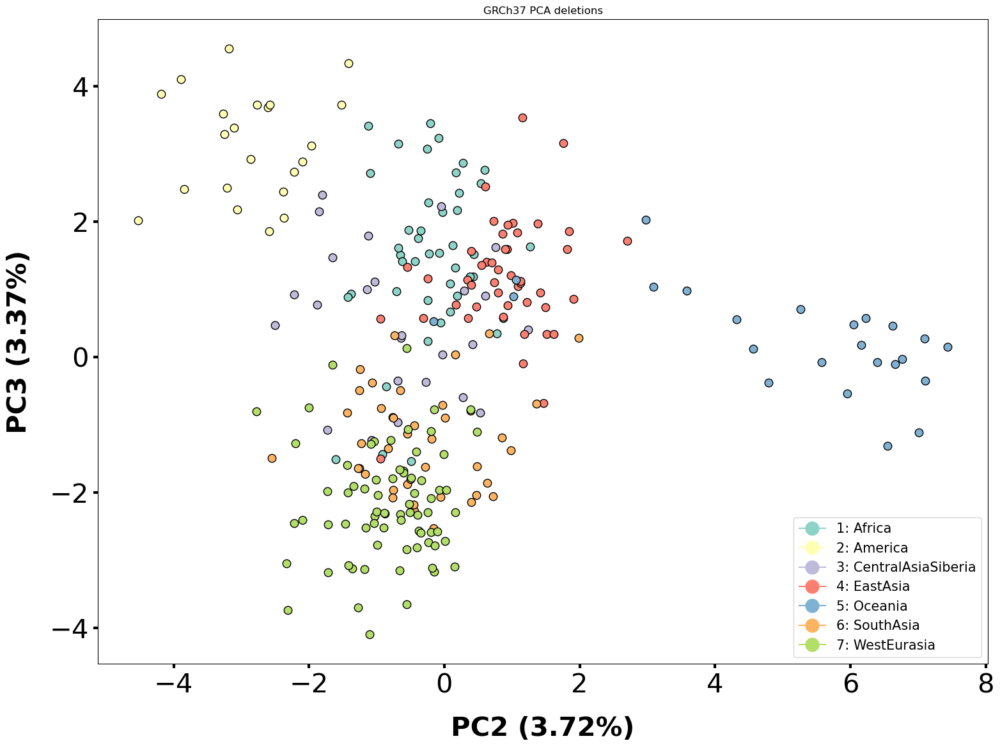

In [38]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (3.72%)', label_vertical='PC3 (3.37%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3
10-Region                                                                  
Oceania            F  PapuaNewGuinea    20.482691   -42.445560   -47.457035
America            F        Colombia   -72.284470    -9.620996   -17.562679
WestEurasia        M          France    27.842941    18.432928    30.185534
WestEurasia        M  Italy(Bergamo)    36.677639    39.113213     0.579405
Africa             M           Congo   -34.675972    30.046877   -51.263771
...              ...             ...          ...          ...          ...
America            M          Brazil   -72.854683   -28.831661    -0.915525
Oceania            M       Australia   -12.576965   -11.811598   -54.205479
Oceania            U       Australia   -30.328127   -14.554811   -42.828014
America            F          Mexico   -66.288132   -42.483524   -14.817302
Africa             M           Sudan   -18.252165    32.302803   -24.120705

[275 rows x

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

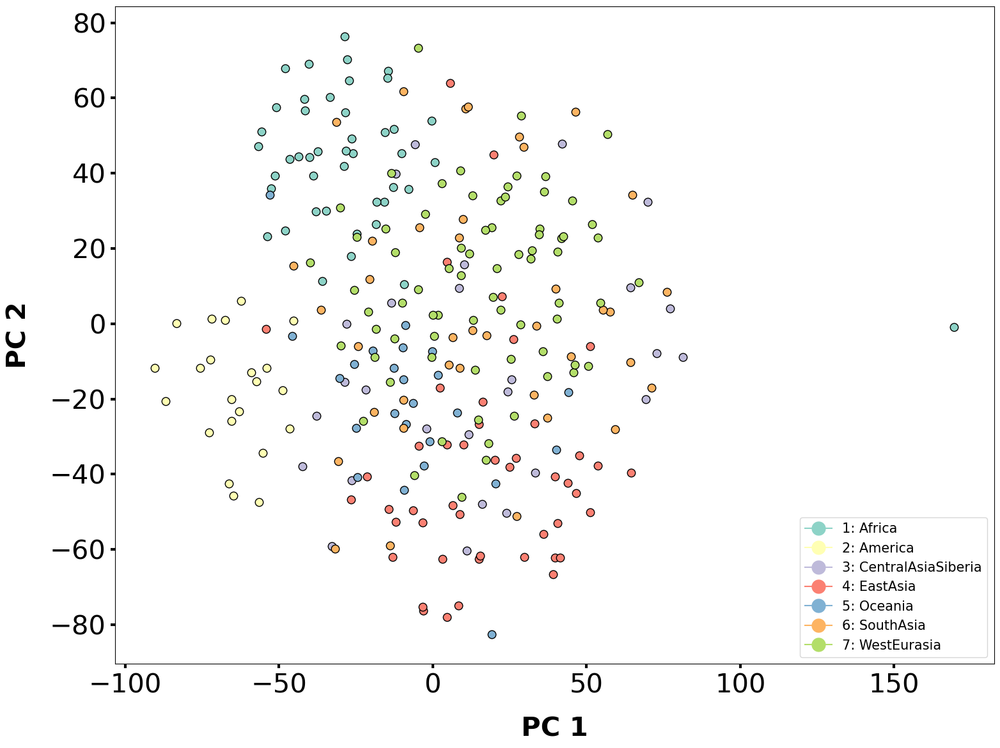

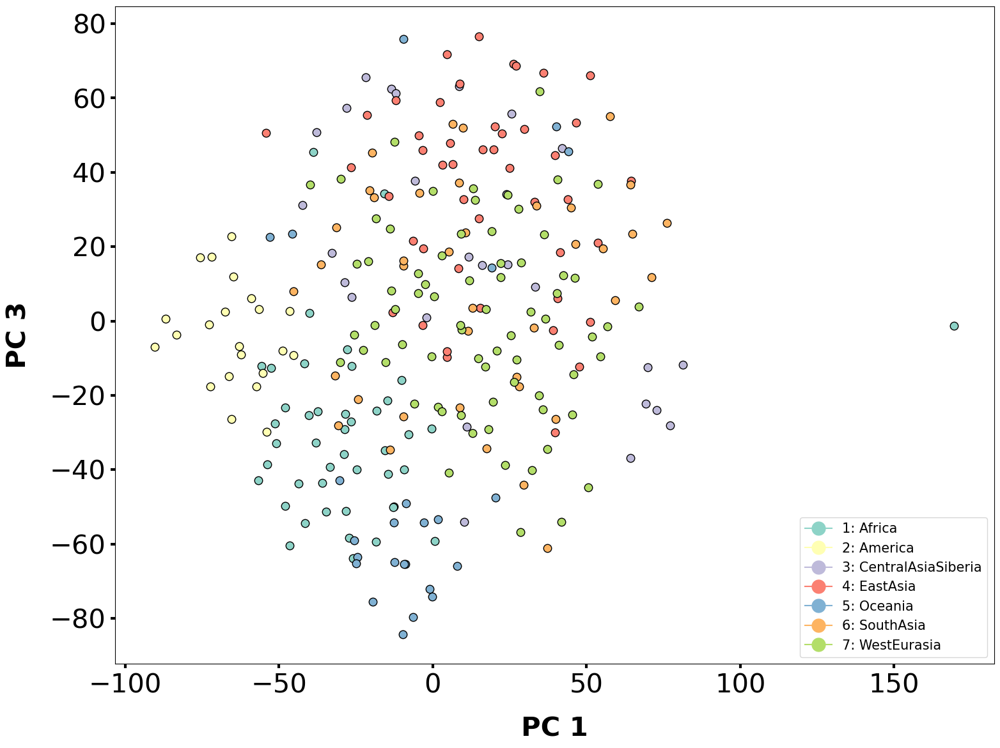

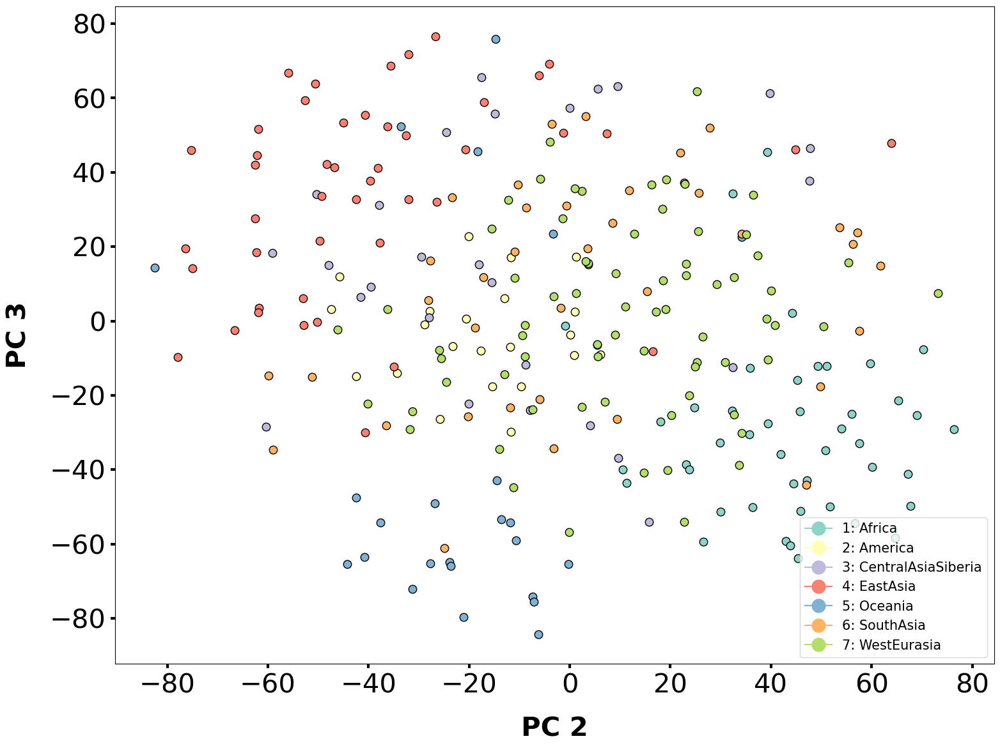

In [40]:
from sklearn.manifold import TSNE
#x = StandardScaler().fit_transform(counts)
pca = TSNE(n_components=3)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3'],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)

components = [1,2,3]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

<h1> Duplications

In [71]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


,346
Sample_ID,
LP6005441-DNA_A03,2.166667
LP6005441-DNA_A04,2.500000
LP6005441-DNA_A05,1.833333
LP6005441-DNA_A06,1.833333
LP6005441-DNA_A08,1.846154
...,...
SS6004476,1.888889
SS6004477,2.333333
SS6004478,2.500000


In [72]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [73]:
#PCA
pca = PCA(n_components=5)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

ValueError: n_components=5 must be between 0 and min(n_samples, n_features)=1 with svd_solver='full'

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

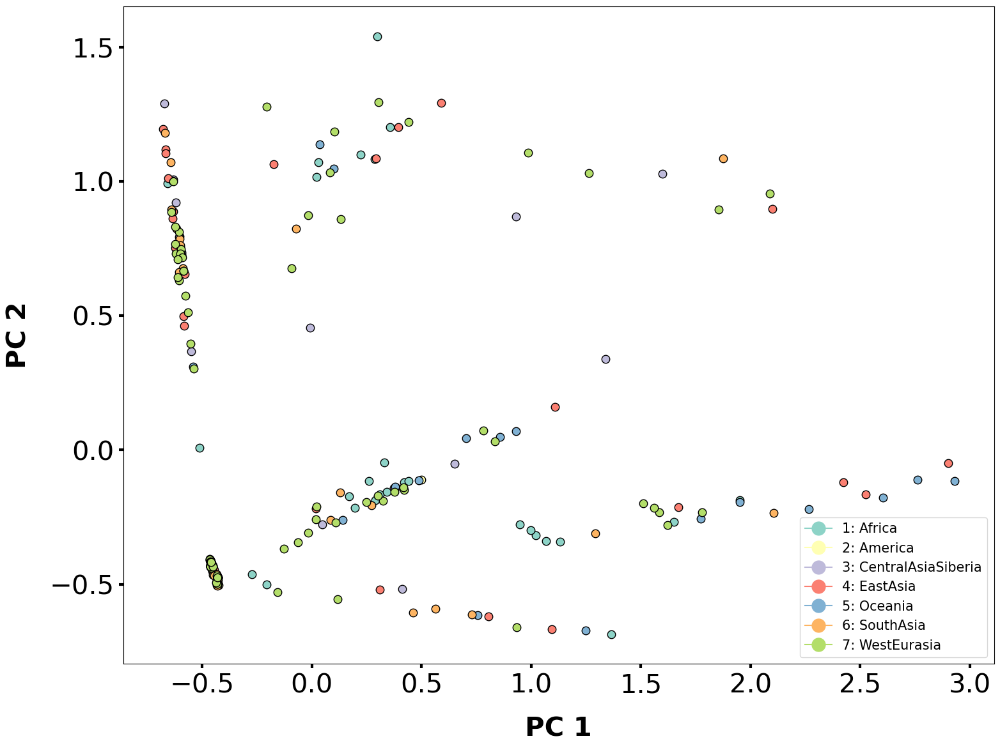

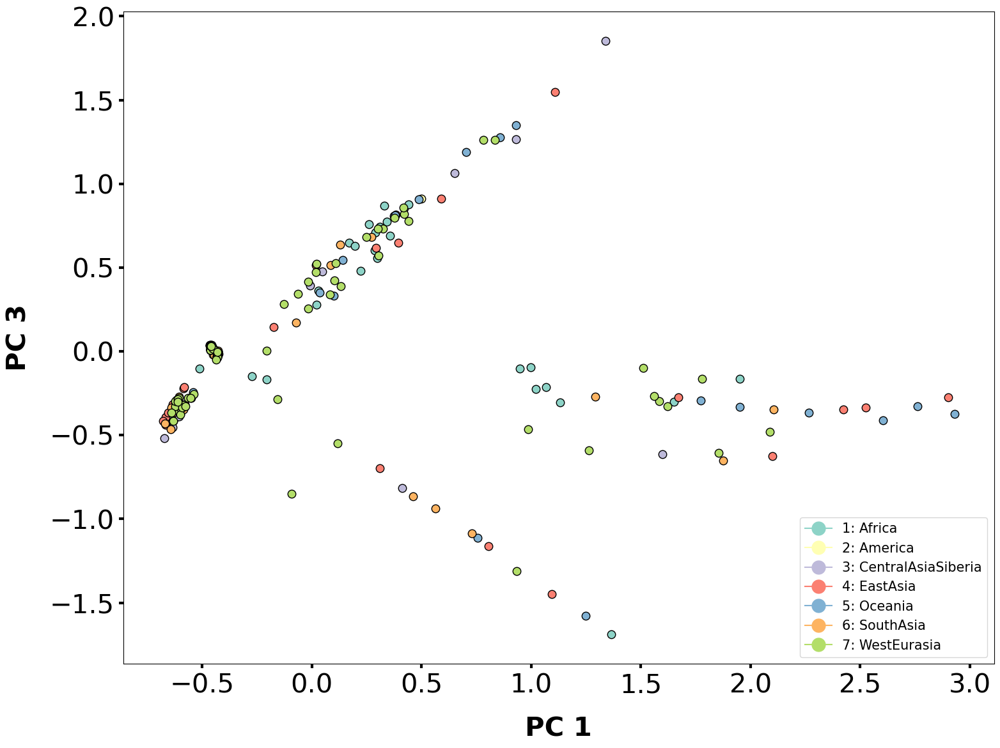

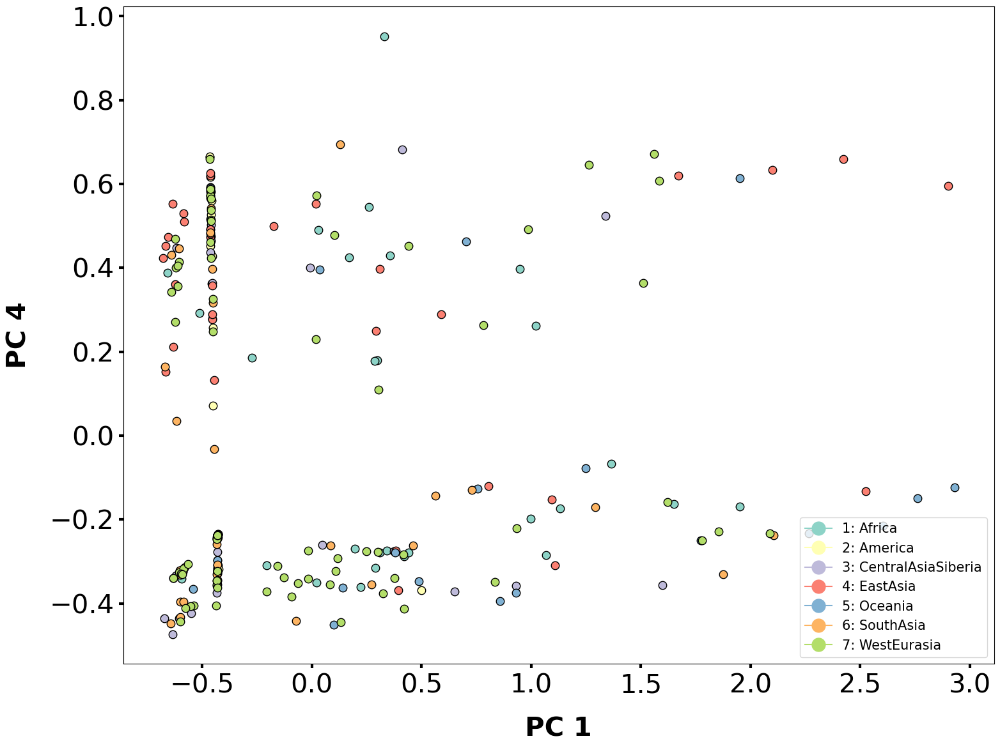

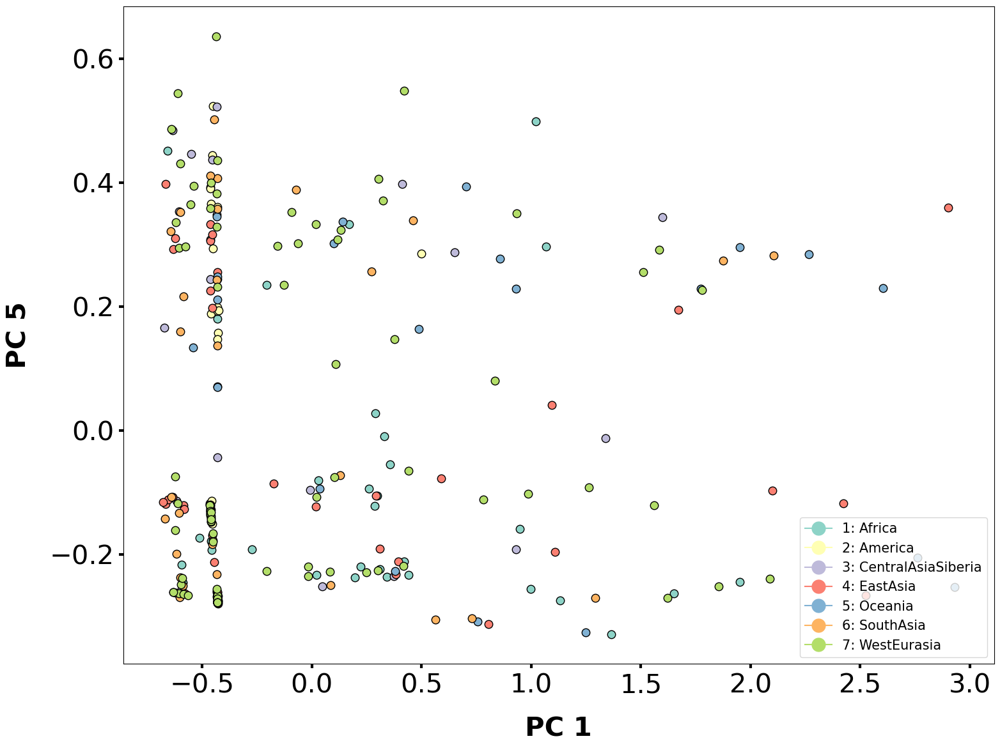

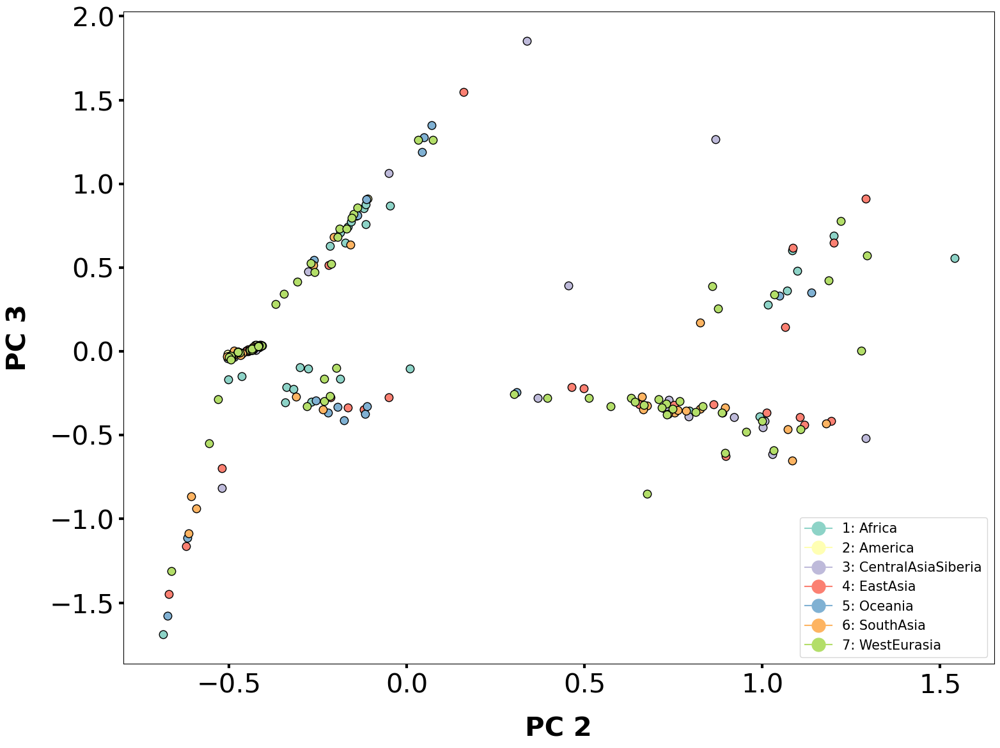

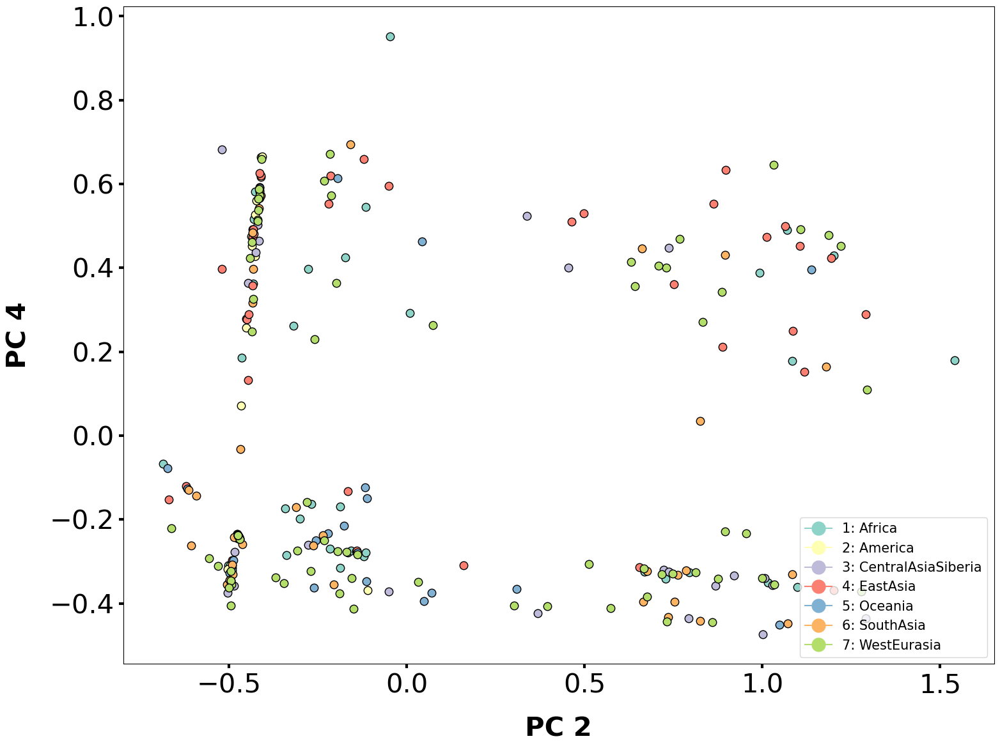

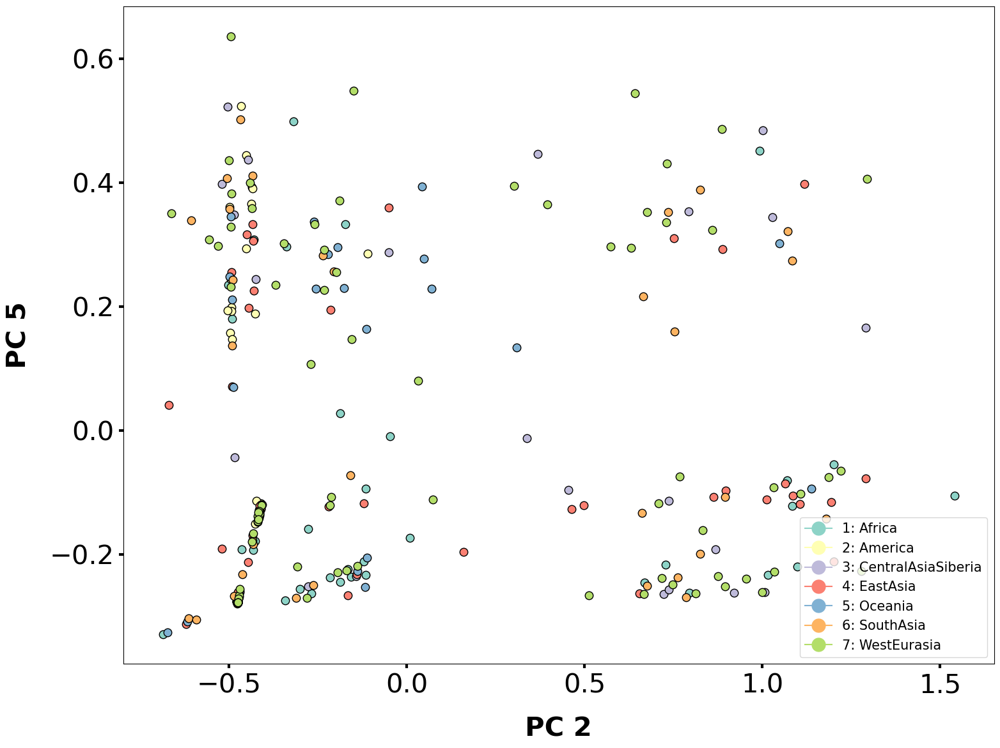

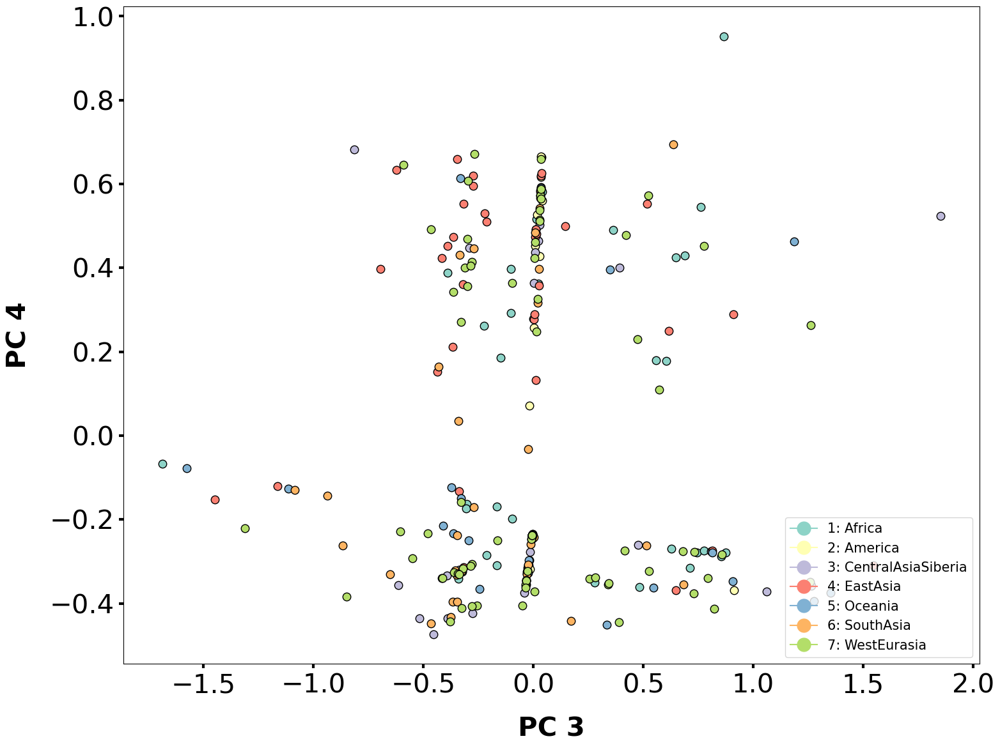

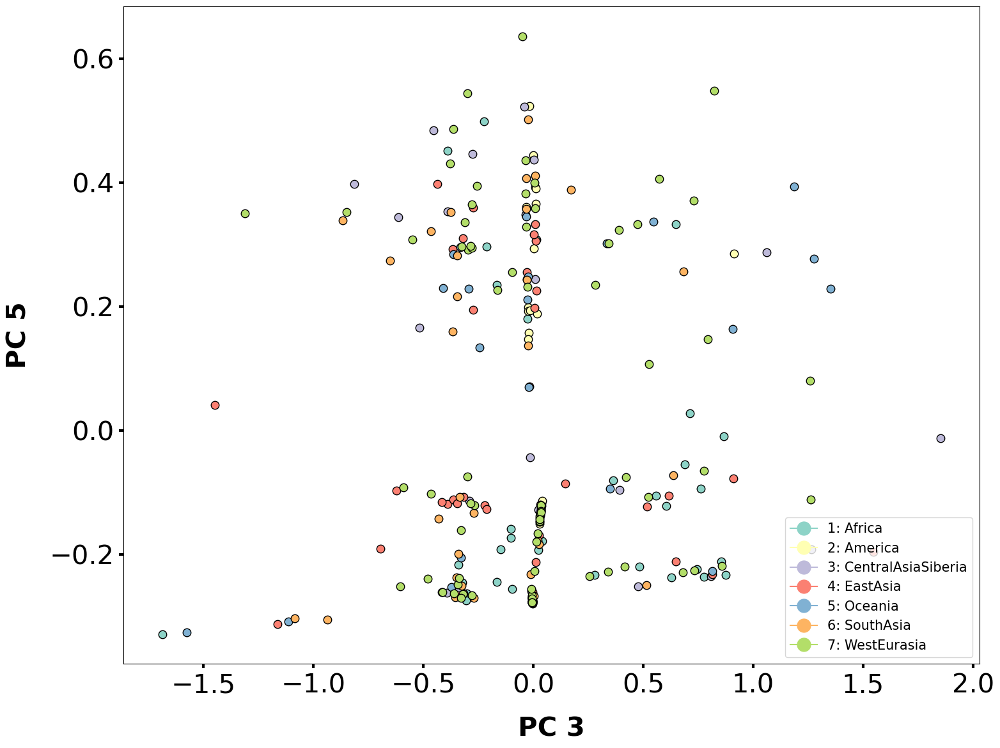

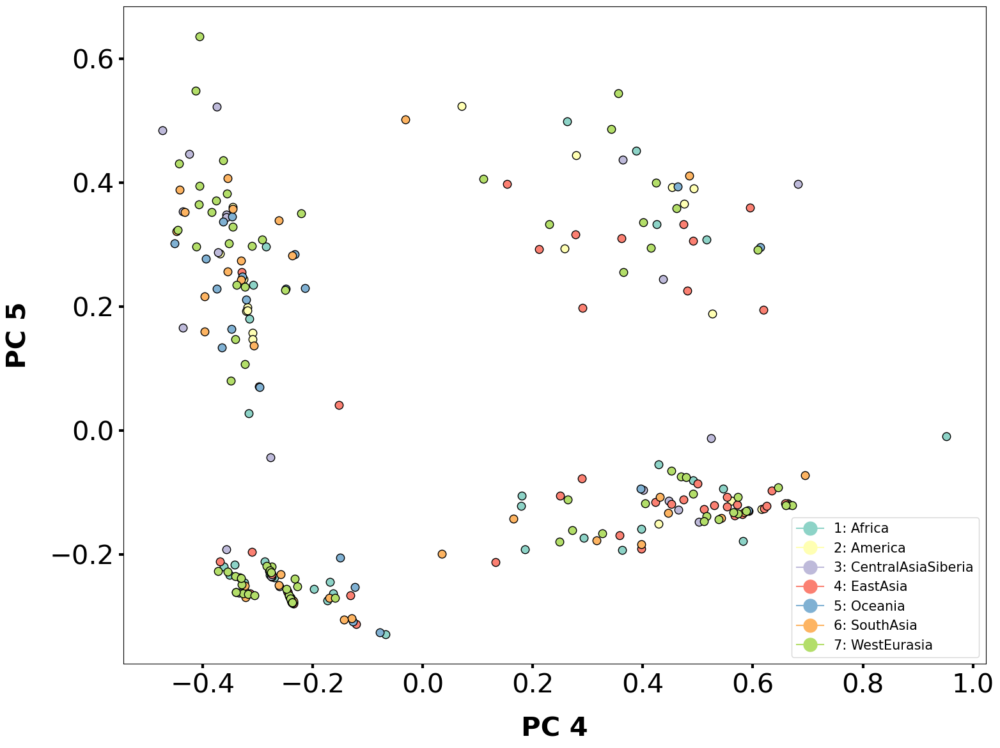

In [39]:
components = [1,2,3,4,5]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [40]:
pca.explained_variance_ratio_

array([0.42552687, 0.24613321, 0.15993992, 0.09841705, 0.04728886])

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

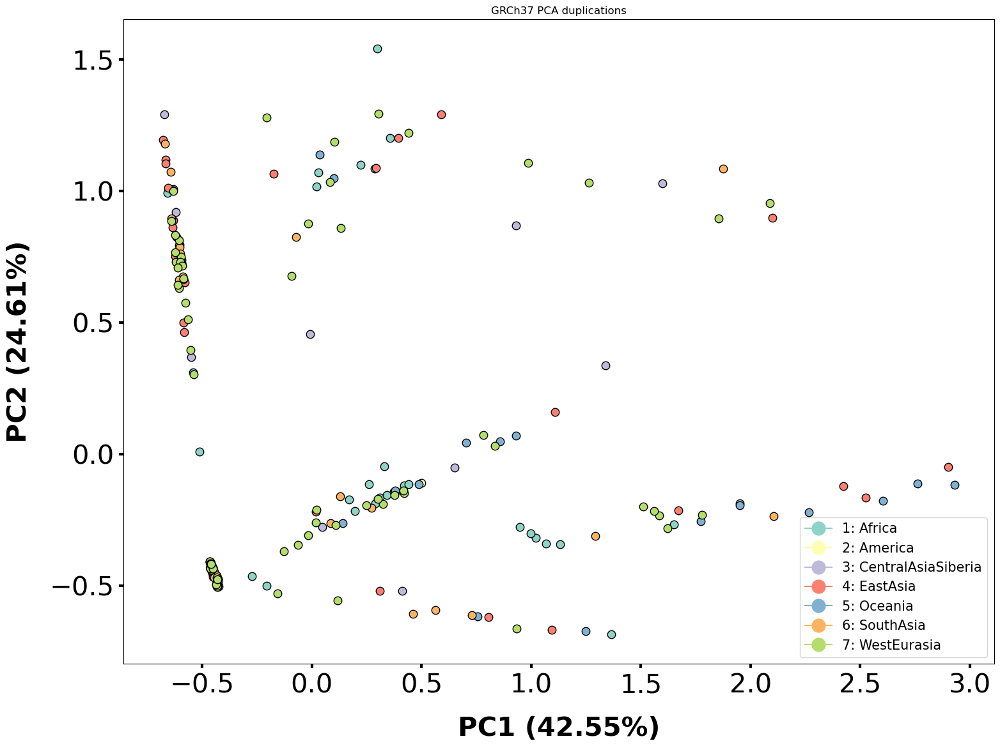

In [41]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (42.55%)', label_vertical='PC2 (24.61%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

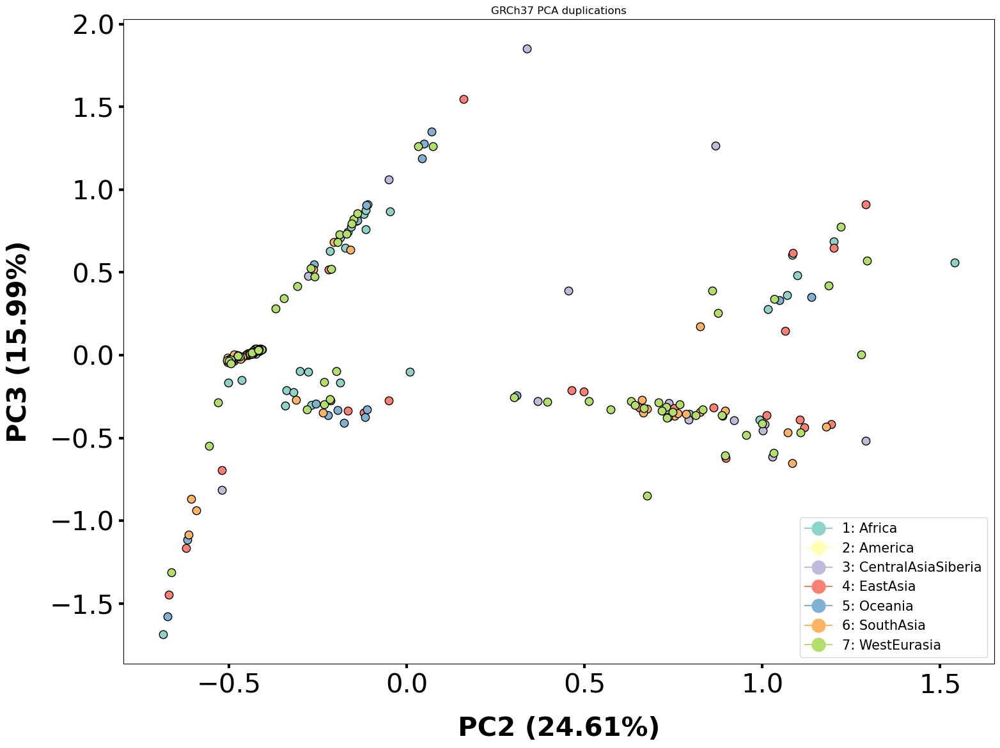

In [42]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (24.61%)', label_vertical='PC3 (15.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc23.png', transparent=True)

<h1> Dmean results 

In [ ]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

In [ ]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

In [ ]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


In [ ]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



In [ ]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [ ]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [ ]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

In [ ]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [ ]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)